# <font color='blue'>Data Science Academy</font>
# <font color='blue'>Deep Learning Frameworks</font>

In [1]:
# Versão da Linguagem Python
from platform import python_version
print('Versão da Linguagem Python Usada Neste Jupyter Notebook:', python_version())

Versão da Linguagem Python Usada Neste Jupyter Notebook: 3.7.6


## Mini-Projeto - Detecção Facial com Detectron 2 e PyTorch

A detecção facial é a tarefa de encontrar rostos nas imagens. 

Isso é útil para:

- Sistemas de segurança (o primeiro passo para reconhecer uma pessoa)
- Foco automático e detecção de sorriso para tirar ótimas fotos
- Detectar idade e estado emocional para campanhas de Marketing 

Historicamente, esse era um problema muito difícil de resolver. Hoje, nem tanto!

Atualmente, os modelos de detecção facial estão incluídos em quase todos os pacotes / frameworks de Visão Computacional. 

Neste Mini-Projeto criaremos um modelo de Detecção Facial usando uma biblioteca criada pela Equipe de Data Science do Facebook, o Detectron 2.

Leia todos os comentários com atenção. Será necessário executar o treinamento do modelo em uma máquina com GPU. Trabalhe no Titan se desejar.

## Detectron 2

[Detectron2](https://github.com/facebookresearch/detectron2) é uma biblioteca para criar modelos avançados de detecção de objetos e segmentação de imagens. Foi desenvolvido pela equipe do Facebook. 

Internamente, o Detectron2 usa PyTorch. Acesse os links abaixo com mais detalhes:

https://detectron2.readthedocs.io/notes/benchmarks.html

https://ai.facebook.com

O verdadeiro poder do Detectron2 reside na enorme quantidade de modelos pré-treinados disponíveis no [Model Zoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md). Usaremos um deles.

Para usar alguns desses modelos pré-treinados, precisamos formatar os dados de acordo com o mesmo formato usado pela equipe do Facebook, usando o padrão COCO (Common Object in COntext).

http://cocodataset.org/

Vamos ao trabalho.

In [2]:
!nvidia-smi

Tue Apr  7 23:49:16 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 440.64.00    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  TITAN X (Pascal)    On   | 00000000:05:00.0 Off |                  N/A |
| 24%   43C    P8     9W / 250W |    331MiB / 12194MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  GeForce GTX 108...  On   | 00000000:09:00.0 Off |                  N/A |
| 25%   44C    P8    10W / 250W |    227MiB / 11178MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  T

### Instalando o Detectron2

A instalação do Detectron2 requer atenção especial. Execute cada célula abaixo lendo ATENTAMENTE os comentários em cada célula. 

Confira aqui os requisitos de instalação:

https://github.com/facebookresearch/detectron2/blob/master/INSTALL.md

In [3]:
# Para atualizar um pacote, execute o comando abaixo no terminal ou prompt de comando:
# pip install -U nome_pacote

# Para instalar a versão exata de um pacote, execute o comando abaixo no terminal ou prompt de comando:
# pip install nome_pacote==versão_desejada

# Depois de instalar ou atualizar o pacote, reinicie o jupyter notebook.

# Instala o pacote watermark. 
# Esse pacote é usado para gravar as versões de outros pacotes usados neste jupyter notebook.
#!pip install -q -U watermark

In [4]:
# Instala o OpenCV
#!pip install -q opencv-python==4.2.0.34

In [5]:
# Instala o OpenCV Headless
#!pip install -q opencv-python-headless==4.2.0.34

In [6]:
# Instala API COCO (formato dos dados para treinar os modelos)
#!pip install -q 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

In [7]:
# Instala PyTorch com suporte a plataforma CUDA (somente para computadores com GPU)
#!pip install -q -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 

In [8]:
# Instala pacote para suporte a C++
#!pip install -q cython 

In [9]:
# Instala pyyaml
#!pip install -q --ignore-installed pyyaml==5.1

As duas células abaixo devem ser executadas somente na primeira vez que executar este Jupyter na máquina. 

**Isso deve ser feito somente na primeira execução deste notebook**.

In [10]:
# Clone do repositório do Detectron2
# Seu computador pode não ter o Git instalado. Acesse este link e instale de acordo com seu sistema operacional:
# https://git-scm.com/book/en/v2/Getting-Started-Installing-Git
#!git clone https://github.com/facebookresearch/detectron2 detectron2_repo

In [11]:
# Instala o Detectron2
# Somente na primeira vez que executar este Jupyter Notebook
#!pip install -q -e detectron2_repo

>Uma vez instaladas as dependências acima, você precisará reiniciar o Jupyter Notebook no terminal. Salve este notebook, feche-o, pare o Jupyter Notebook, inicie novamente e continue o trabalho.

In [12]:
# Imports gerais
import os
import cv2
import glob
import json
import ntpath
import random
import urllib
import itertools
import numpy as np
import pandas as pd
from tqdm import tqdm
import PIL.Image as Image

# Torch
import torch
import torchvision

# Detectron2
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode
from detectron2.utils.logger import setup_logger
setup_logger()

# Gráficos e Imagens
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Formatação das imagens
from pylab import rcParams
rcParams['figure.figsize'] = 12, 8
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

# Seed
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

In [13]:
# Versões dos pacotes usados neste jupyter notebook
%reload_ext watermark
%watermark -a "Data Science Academy" --iversions

numpy       1.18.2
pandas      1.0.3
torch       1.4.0+cu100
torchvision 0.5.0+cu100
seaborn     0.10.0
json        2.0.9
cv2.cv2     4.2.0
PIL.Image   7.0.0
detectron2  0.1.1
Data Science Academy


## Conjunto de Dados

Nosso conjunto de dados é fornecido por [Dataturks](https://dataturks.com/), e está disponível no [Kaggle](https://www.kaggle.com/dataturks/face-detection-in-images). 

O dataset:

> Temos cerca de 500 imagens com 1100 faces marcadas manualmente através da caixa delimitadora.

Fiz o download do arquivo JSON que contém as anotações. Vamos carregá-lo:

In [14]:
# Carrega o arquivo JSON
faces_df = pd.read_json('dicionarios/face_detection.json', lines = True)

In [15]:
# Visualiza o conteúdo
faces_df.head()

,content,annotation,extras
0,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
1,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
2,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
3,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
4,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN


Cada linha contém uma anotação de face única. Observe que várias linhas podem apontar para uma única imagem (por exemplo, várias faces por imagem).

## Pré-Processamento de Dados

O conjunto de dados contém apenas URLs e anotações de imagem. Teremos que baixar as imagens. Também normalizamos as anotações, para que seja mais fácil usá-las com o Detectron2 posteriormente.

In [16]:
# Cria o diretório para gravar as imagens
os.makedirs("faces", exist_ok = True)

In [17]:
# Lista para receber os dados
dataset = []

In [18]:
# Loop
for index, row in tqdm(faces_df.iterrows(), total = faces_df.shape[0]):
    
    # Define a url de cada imagem
    img = urllib.request.urlopen(row["content"])
    
    # Abre a imagem
    img = Image.open(img)
    
    # Converte para RGB (3 cores)
    img = img.convert('RGB')

    # Define o nome da imagem
    image_name = f'face_{index}.jpeg'

    # Salva a imagem emdisco
    img.save(f'faces/{image_name}', "JPEG")
    
    # Obtém a anotação (label da imagem)
    annotations = row['annotation']
    
    # Loop pela anotação de cada imagem
    for an in annotations:

        # Dicionário
        data = {}

        # Largura, altura e pontos da imagem
        width = an['imageWidth']
        height = an['imageHeight']
        points = an['points']

        # Nome, largura e altura da imagem
        data['file_name'] = image_name
        data['width'] = width
        data['height'] = height

        # Coordenadas da bounding box (caixa delimitadora) de cada face na imagem
        data["x_min"] = int(round(points[0]["x"] * width))
        data["y_min"] = int(round(points[0]["y"] * height))
        data["x_max"] = int(round(points[1]["x"] * width))
        data["y_max"] = int(round(points[1]["y"] * height))

        # Nome da classe
        data['class_name'] = 'face'

        # Grava o resultado na lista
        dataset.append(data)

100%|██████████| 409/409 [03:24<00:00,  2.00it/s]


Vamos colocar os dados em um dataframe.

In [19]:
# Converte a lista em um dataframe
df = pd.DataFrame(dataset)

In [20]:
# Visualiza
df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,face_0.jpeg,650,333,56,102,112,151,face
1,face_0.jpeg,650,333,379,97,428,156,face
2,face_1.jpeg,1280,697,903,162,985,252,face
3,face_2.jpeg,460,240,216,12,279,80,face
4,face_2.jpeg,460,240,289,2,343,74,face


In [21]:
# Shape
print(df.file_name.unique().shape[0], df.shape[0])

409 1132


Temos um total de 409 imagens e 1132 anotações. Vamos salvá-los no disco (para que você possa reutilizá-los).

In [22]:
# Gravando as anotações
df.to_csv('dicionarios/annotations.csv', header = True, index = None)

### Análise Exploratória

Vamos ver alguns exemplos de dados anotados. Usaremos o OpenCV para carregar uma imagem, adicionar as caixas delimitadoras e redimensioná-la. Definiremos uma função auxiliar para fazer tudo isso.

In [23]:
# Função visualizar as imagens a partir das anotações
def annotate_image(annotations, resize = True):
    
    # Nome do arquivo
    file_name = annotations.file_name.to_numpy()[0]
    
    # Leitura da imagem com OpenCV
    img = cv2.cvtColor(cv2.imread(f'faces/{file_name}'), cv2.COLOR_BGR2RGB)

    # Busca as anotações 
    for i, a in annotations.iterrows():    
        cv2.rectangle(img, (a.x_min, a.y_min), (a.x_max, a.y_max), (0, 255, 0), 2)

    # Redimensiona a imagem se necessário
    if not resize:
        return img

    # Retroa a imagem
    return cv2.resize(img, (384, 384), interpolation = cv2.INTER_AREA)

(-0.5, 499.5, 499.5, -0.5)

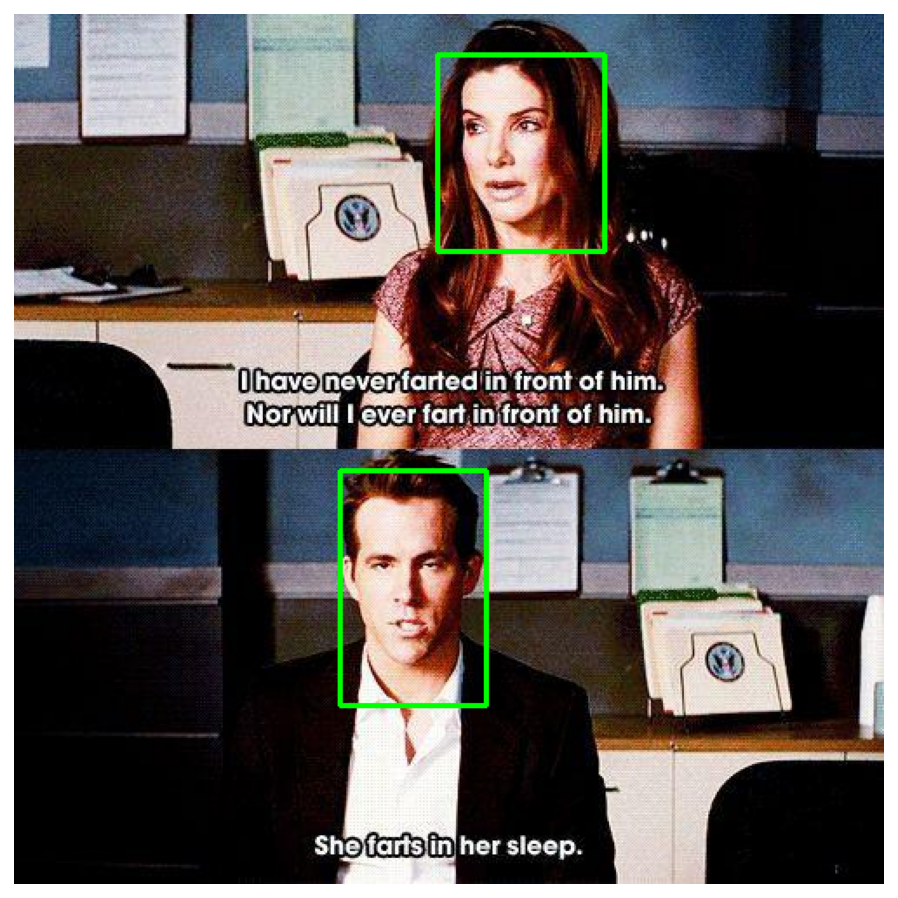

In [24]:
# Visualizando uma imagem com anotação
img_df = df[df.file_name == df.file_name.unique()[5]]
img = annotate_image(img_df, resize = False)
plt.imshow(img)
plt.axis('off')

(-0.5, 183.5, 273.5, -0.5)

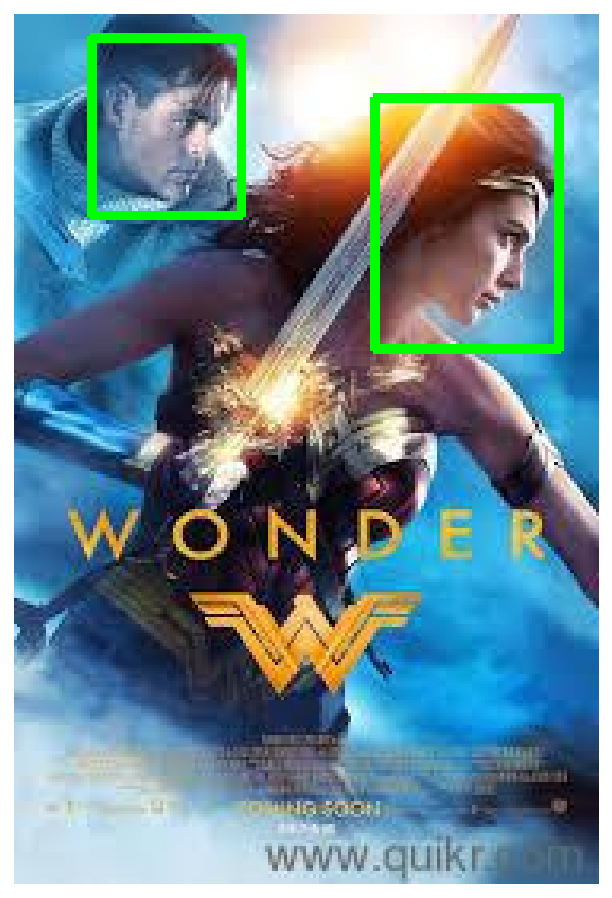

In [25]:
# Visualizando uma imagem com anotação
img_df = df[df.file_name == df.file_name.unique()[9]]
img = annotate_image(img_df, resize = False)
plt.imshow(img)
plt.axis('off')

Essas são boas, as anotações são claramente visíveis. Podemos usar o torchvision para criar uma grade de imagens. Observe que as imagens estão em vários tamanhos, então vamos redimensioná-las.

In [26]:
# Obtendo amostras de imagens
sample_images = [annotate_image(df[df.file_name == f]) for f in df.file_name.unique()[:10]]
sample_images = torch.as_tensor(sample_images)

In [27]:
# Shape do tensor
sample_images.shape

torch.Size([10, 384, 384, 3])

In [28]:
# Precisamos ajustar o shape
sample_images = sample_images.permute(0, 3, 1, 2)

In [29]:
# Shape
sample_images.shape

torch.Size([10, 3, 384, 384])

(-0.5, 1931.5, 773.5, -0.5)

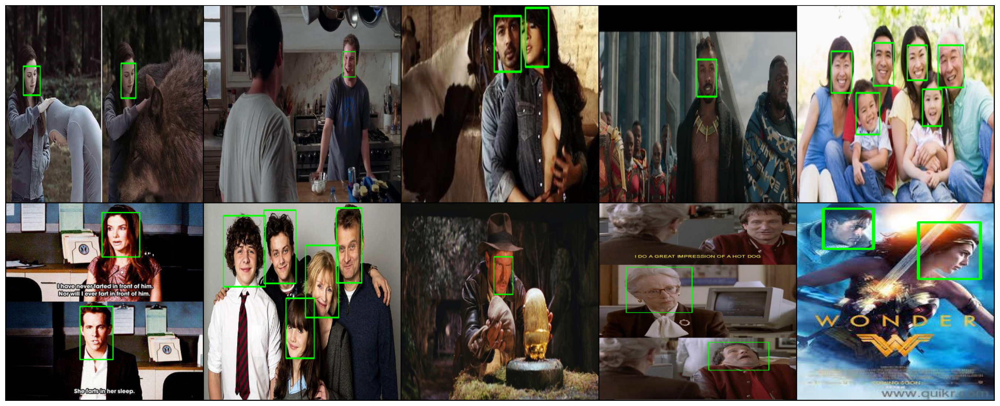

In [30]:
# Plot de várias imagens em grid
plt.figure(figsize = (24, 12))
grid_img = torchvision.utils.make_grid(sample_images, nrow = 5)
plt.imshow(grid_img.permute(1, 2, 0))
plt.axis('off')

Você pode ver claramente que algumas anotações estão ausentes (coluna 4). Teremos que lidar com isso de alguma forma.

## Preparando os Dados Para o Modelo

In [31]:
# Carregamos as anotações
df = pd.read_csv('dicionarios/annotations.csv')

In [32]:
# Diretório das imagens
IMAGES_PATH = f'faces'

In [33]:
# Retorna imagens únicas
unique_files = df.file_name.unique()

In [34]:
# Prepara os dados de treino e de teste
# O train_test_split clássico não funcionaria aqui, porque queremos uma divisão entre os nomes dos arquivos.
train_files = set(np.random.choice(unique_files, int(len(unique_files) * 0.95), replace = False))
train_df = df[df.file_name.isin(train_files)]
test_df = df[~df.file_name.isin(train_files)]

In [35]:
# Dados de treino
train_df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,face_0.jpeg,650,333,56,102,112,151,face
1,face_0.jpeg,650,333,379,97,428,156,face
2,face_1.jpeg,1280,697,903,162,985,252,face
3,face_2.jpeg,460,240,216,12,279,80,face
4,face_2.jpeg,460,240,289,2,343,74,face


In [36]:
# Obtém as classes
classes = df.class_name.unique().tolist()

In [37]:
# Temos como classe de saída apenas a face na imagem
classes

['face']

Em seguida, escreveremos uma função que converte nosso conjunto de dados em um formato usado pelo Detectron2, o COCO.

In [38]:
# Função para colocar as imagens em formato COCO
def create_dataset_dicts(df, classes):
    
    # Lista para os dicionários de classe
    dataset_dicts = []
        
    # Loop por cada imagem
    for image_id, img_name in enumerate(df.file_name.unique()):

        # Dicionário
        record = {}

        # Imagem
        image_df = df[df.file_name == img_name]

        # Caminho
        file_path = f'{IMAGES_PATH}/{img_name}'
        
        # Dados da imagem
        record["file_name"] = file_path
        record["image_id"] = image_id
        record["height"] = int(image_df.iloc[0].height)
        record["width"] = int(image_df.iloc[0].width)

        # Objetos
        objs = []
    
        # Loop
        for _, row in image_df.iterrows():

            # Coordenadas
            xmin = int(row.x_min)
            ymin = int(row.y_min)
            xmax = int(row.x_max)
            ymax = int(row.y_max)

            poly = [(xmin, ymin), (xmax, ymin), (xmax, ymax), (xmin, ymax)]
            poly = list(itertools.chain.from_iterable(poly))

            obj = {"bbox": [xmin, ymin, xmax, ymax], 
                   "bbox_mode": BoxMode.XYXY_ABS, 
                   "segmentation": [poly], 
                   "category_id": classes.index(row.class_name), 
                   "iscrowd": 0}
    
            objs.append(obj)

    record["annotations"] = objs
    dataset_dicts.append(record)
    return dataset_dicts

Convertemos cada linha de anotação em um único registro com uma lista de anotações. Você também pode perceber que estamos criando um polígono exatamente da mesma forma que a caixa delimitadora. Isso é necessário para os modelos de segmentação de imagens no Detectron2.

Você precisará registrar seu conjunto de dados nos catálogos de conjunto de dados e metadados. Faremos isso na célula abaixo.

In [39]:
# Registrando o conjunto de dados
for d in ["train", "val"]:
    DatasetCatalog.register("faces_" + d, lambda d=d: create_dataset_dicts(train_df if d == "train" else test_df, classes))
    MetadataCatalog.get("faces_" + d).set(thing_classes=classes)

In [40]:
# Gerando os metadados
statement_metadata = MetadataCatalog.get("faces_train")

Infelizmente, o avaliador para o conjunto de testes não é incluído por padrão. Podemos resolver isso facilmente, escrevendo nossa própria classe.

In [41]:
# Classe paar trenar e avaliar o modelo
class treinaModelo(DefaultTrainer):
  
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder = None):

        if output_folder is None:
            os.makedirs("eval", exist_ok = True)
            output_folder = "eval"

        return COCOEvaluator(dataset_name, cfg, False, output_folder)

Os resultados da avaliação serão armazenados na pasta `eval` se nenhuma pasta for fornecida.

O ajuste fino de um modelo Detectron2 não é nada como escrever código PyTorch. Carregaremos um arquivo de configuração, alteraremos alguns valores e iniciaremos o processo de treinamento. 

Usaremos o modelo pré-treinado Mask R-CNN X101-FPN. 

Esse modelo foi pré-treinado no dataset [COCO dataset](http://cocodataset.org/#home) e alcança um desempenho muito bom. A desvantagem é que é lento para treinar.

Vamos carregar o arquivo de configuração e os pesos do modelo pré-treinado.

In [42]:
# Inicia o arquivo de configuração
cfg = get_cfg()

# Carrega o arquivo de configuração
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))

# Carrega os pesos do modelo pré-treinado
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")

In [43]:
# Especificamos os conjuntos de dados (nós os registramos) que usaremos para treinamento e avaliação
cfg.DATASETS.TRAIN = ("faces_train",)
cfg.DATASETS.TEST = ("faces_val",)
cfg.DATALOADER.NUM_WORKERS = 4

In [44]:
# E para o otimizador, definiremos alguns valores. Fique à vontade para alterar esses valores e re-treinar o modelo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)
cfg.TEST.EVAL_PERIOD = 500

Os primeiros 3 parâmetros são padrões (tamanho do lote, número máximo de iterações e taxa de aprendizado).

Mas temos ainda:

- `WARMUP_ITERS` - a taxa de aprendizado começa em 0 e vai para a predefinida para este número de iterações
- `STEPS` - os pontos de verificação (número de iterações) nos quais a taxa de aprendizado será reduzida em `GAMMA`

Por fim, especificaremos o número de classes e o período em que avaliaremos no conjunto de teste.

In [45]:
# Checamos se o diretório de saída existe
os.makedirs(cfg.OUTPUT_DIR, exist_ok = True)

E então treinamos o modelo.

In [46]:
# Carregamos as configurações
trainer = treinaModelo(cfg) 

[04/07 23:58:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[04/07 23:58:42 d2.data.build]: Removed 0 images with no usable annotations. 1 images left.
[04/07 23:58:42 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    face    | 2            |
|            |              |
[04/07 23:58:42 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[04/07 23:58:42 d2.data.common]: Serialized dataset takes 0.00 MiB
[04/07 23:58:42 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[04/07 23:58:42 d2.data.build]: Using training sampler TrainingSampler


In [47]:
# Vamos iniciar o treinamento do zero e não de onde parou
trainer.resume_or_load(resume = False)

'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


In [48]:
# Treinamento - Dura 30 minutos no Titan
trainer.train()

[04/07 23:58:54 d2.engine.train_loop]: Starting training from iteration 0
[04/07 23:59:17 d2.utils.events]:  eta: 0:27:17  iter: 19  total_loss: 1.867  loss_cls: 0.586  loss_box_reg: 0.491  loss_mask: 0.689  loss_rpn_cls: 0.114  loss_rpn_loc: 0.022  time: 1.1468  data_time: 0.0162  lr: 0.000020  max_mem: 10492M
[04/07 23:59:40 d2.utils.events]:  eta: 0:27:08  iter: 39  total_loss: 1.909  loss_cls: 0.507  loss_box_reg: 0.654  loss_mask: 0.652  loss_rpn_cls: 0.096  loss_rpn_loc: 0.018  time: 1.1512  data_time: 0.0064  lr: 0.000040  max_mem: 10492M
[04/08 00:00:04 d2.utils.events]:  eta: 0:26:57  iter: 59  total_loss: 1.929  loss_cls: 0.434  loss_box_reg: 0.840  loss_mask: 0.573  loss_rpn_cls: 0.050  loss_rpn_loc: 0.018  time: 1.1541  data_time: 0.0069  lr: 0.000060  max_mem: 10492M
[04/08 00:00:27 d2.utils.events]:  eta: 0:26:45  iter: 79  total_loss: 1.703  loss_cls: 0.330  loss_box_reg: 0.868  loss_mask: 0.472  loss_rpn_cls: 0.023  loss_rpn_loc: 0.017  time: 1.1615  data_time: 0.0073  

[04/08 00:09:19 d2.evaluation.coco_evaluation]: Note that some metrics cannot be computed.
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all 

[04/08 00:19:21 d2.utils.events]:  eta: 0:10:33  iter: 979  total_loss: 0.103  loss_cls: 0.020  loss_box_reg: 0.060  loss_mask: 0.023  loss_rpn_cls: 0.000  loss_rpn_loc: 0.001  time: 1.2490  data_time: 0.0074  lr: 0.000979  max_mem: 10492M
[04/08 00:19:47 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[04/08 00:19:47 d2.data.common]: Serialized dataset takes 0.00 MiB
[04/08 00:19:47 d2.evaluation.evaluator]: Start inference on 1 images
[04/08 00:19:47 d2.evaluation.evaluator]: Inference done 1/1. 0.2695 s / img. ETA=0:00:00
[04/08 00:19:47 d2.evaluation.evaluator]: Total inference time: 0:00:00.322401 (0.322401 s / img per device, on 1 devices)
[04/08 00:19:47 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.269476 s / img per device, on 1 devices)
[04/08 00:19:47 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/08 00:19:47 d2.evaluation.coco_evaluation]: Saving results to eval/coco_instances_result

[04/08 00:25:38 d2.utils.events]:  eta: 0:04:28  iter: 1279  total_loss: 0.046  loss_cls: 0.011  loss_box_reg: 0.015  loss_mask: 0.018  loss_rpn_cls: 0.000  loss_rpn_loc: 0.000  time: 1.2491  data_time: 0.0075  lr: 0.000050  max_mem: 10492M
[04/08 00:26:03 d2.utils.events]:  eta: 0:04:04  iter: 1299  total_loss: 0.041  loss_cls: 0.010  loss_box_reg: 0.013  loss_mask: 0.018  loss_rpn_cls: 0.000  loss_rpn_loc: 0.000  time: 1.2493  data_time: 0.0074  lr: 0.000050  max_mem: 10492M
[04/08 00:26:28 d2.utils.events]:  eta: 0:03:39  iter: 1319  total_loss: 0.044  loss_cls: 0.012  loss_box_reg: 0.014  loss_mask: 0.017  loss_rpn_cls: 0.000  loss_rpn_loc: 0.000  time: 1.2495  data_time: 0.0077  lr: 0.000050  max_mem: 10492M
[04/08 00:26:53 d2.utils.events]:  eta: 0:03:15  iter: 1339  total_loss: 0.045  loss_cls: 0.010  loss_box_reg: 0.015  loss_mask: 0.018  loss_rpn_cls: 0.000  loss_rpn_loc: 0.000  time: 1.2495  data_time: 0.0074  lr: 0.000050  max_mem: 10492M
[04/08 00:27:19 d2.utils.events]:  e

## Carregando o Modelo

In [50]:
# Diretório e nome do modelo
cfg.MODEL.WEIGHTS = os.path.join("output", "model_final.pth")

# Define o threshold de teste para o modelo
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75

# Salva o preditor
preditor = DefaultPredictor(cfg)

## Avaliando o Modelo

A avaliação de modelos de detecção de objetos é um pouco diferente quando comparada à avaliação de modelos padrão de classificação ou regressão.

A principal métrica que você precisa conhecer é IoU (interseção sobre união). Ele mede a sobreposição entre dois limites - o predito e a verdade fundamental. Pode obter valores entre 0 e 1.

$$\text{IoU}=\frac{\text{area of overlap}}{\text{area of union}}$$

Usando IoU, pode-se definir um limite (por exemplo > 0,5) para classificar se uma previsão é um verdadeiro positivo (TP) ou um falso positivo (FP).

Agora você pode calcular a precisão média (AP) tomando a área sob a curva de precisão e recuperação. Isso deve fornecer uma compreensão prática de como os modelos de detecção de objetos são avaliados.

In [51]:
# Resultado da avaliação
evaluator = COCOEvaluator("faces_val", cfg, False, output_dir = "./output/")
val_loader = build_detection_test_loader(cfg, "faces_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

[04/08 00:35:09 d2.data.common]: Serializing 1 elements to byte tensors and concatenating them all ...
[04/08 00:35:09 d2.data.common]: Serialized dataset takes 0.00 MiB
[04/08 00:35:09 d2.evaluation.evaluator]: Start inference on 1 images
[04/08 00:35:09 d2.evaluation.evaluator]: Inference done 1/1. 0.1114 s / img. ETA=0:00:00
[04/08 00:35:10 d2.evaluation.evaluator]: Total inference time: 0:00:00.167010 (0.167010 s / img per device, on 1 devices)
[04/08 00:35:10 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.111420 s / img per device, on 1 devices)
[04/08 00:35:10 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/08 00:35:10 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/08 00:35:10 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0

OrderedDict([('bbox',
              {'AP': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APs': 0.0,
               'APm': 0.0,
               'APl': nan}),
             ('segm',
              {'AP': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APs': 0.0,
               'APm': 0.0,
               'APl': nan})])

### Detecção Facial

Vamos ver o modelo funciona e fazer detecção facial em novas imagens.

In [52]:
# Define o diretório
os.makedirs("annotated_results", exist_ok = True)

In [53]:
# Obtém as imagens
test_image_paths = test_df.file_name.unique()

In [55]:
# Aqui fazemos detecção para cada imagem de teste
for teste_image in test_image_paths:
    file_path = f'{IMAGES_PATH}/{teste_image}'
    im = cv2.imread(file_path)
    outputs = preditor(im)
    v = Visualizer(im[:, :, ::-1], metadata = statement_metadata, scale = 1., instance_mode = ColorMode.IMAGE)
    instances = outputs["instances"].to("cpu")
    instances.remove('pred_masks')
    v = v.draw_instance_predictions(instances)
    result = v.get_image()[:, :, ::-1]
    file_name = ntpath.basename(teste_image)
    write_res = cv2.imwrite(f'annotated_results/{file_name}', result)

Vamos conferir.

In [56]:
annotated_images = [f'annotated_results/{f}' for f in test_df.file_name.unique()]

(-0.5, 930.5, 523.5, -0.5)

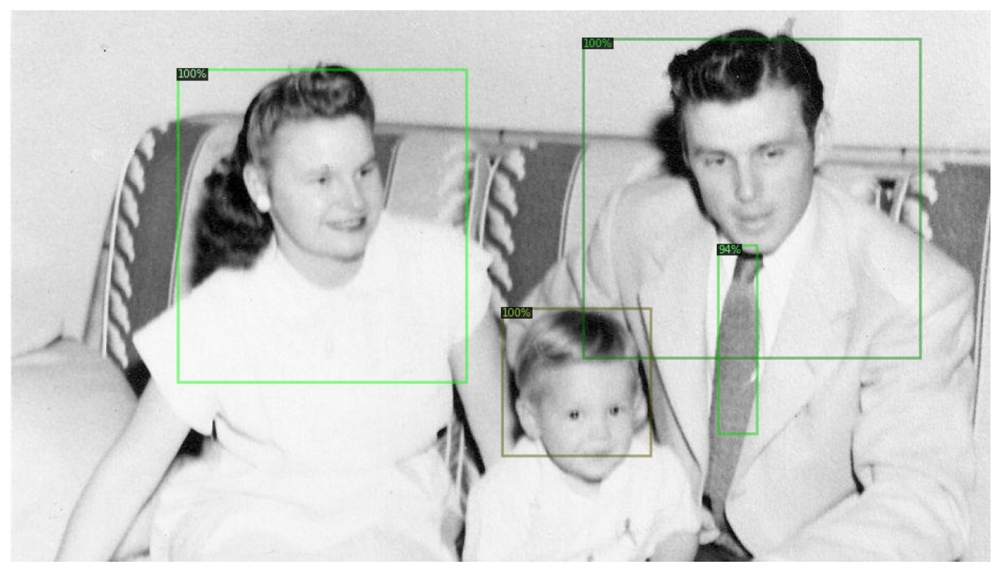

In [58]:
# Detectando faces em imagens
img = cv2.cvtColor(cv2.imread(annotated_images[5]), cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')

(-0.5, 599.5, 392.5, -0.5)

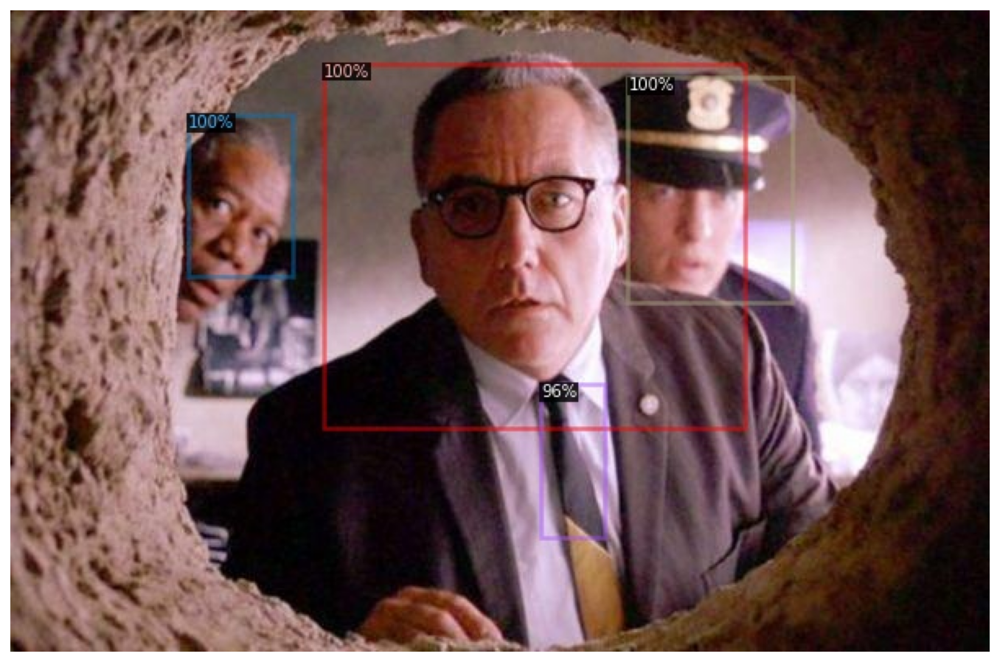

In [64]:
# Detectando faces em imagens
img = cv2.cvtColor(cv2.imread(annotated_images[3]), cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')

(-0.5, 1023.5, 682.5, -0.5)

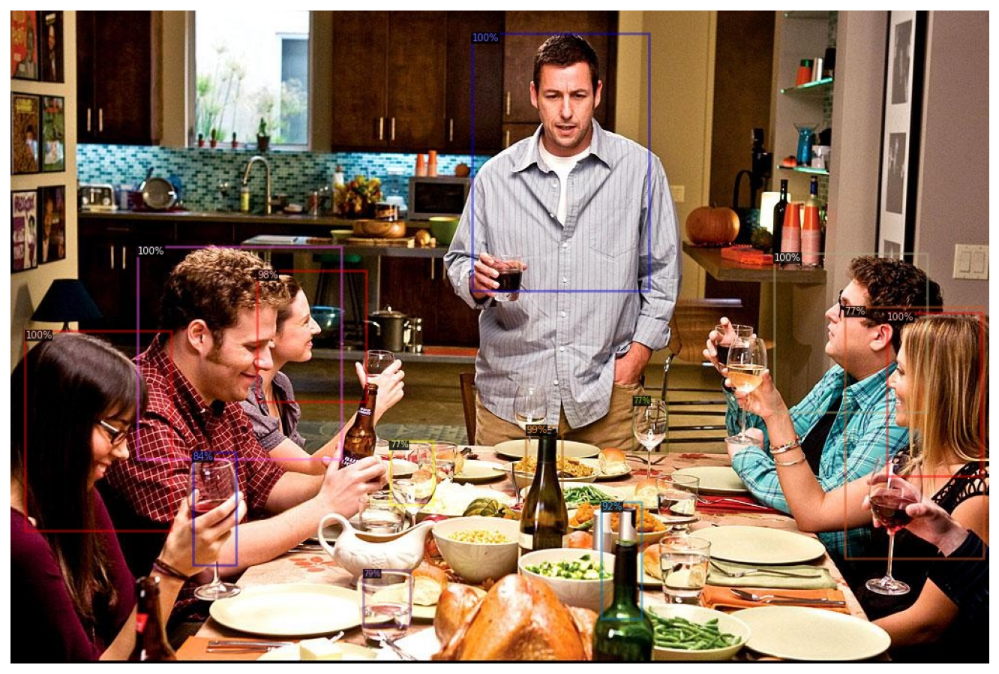

In [66]:
# Detectando faces em imagens
img = cv2.cvtColor(cv2.imread(annotated_images[11]), cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')

(-0.5, 859.5, 495.5, -0.5)

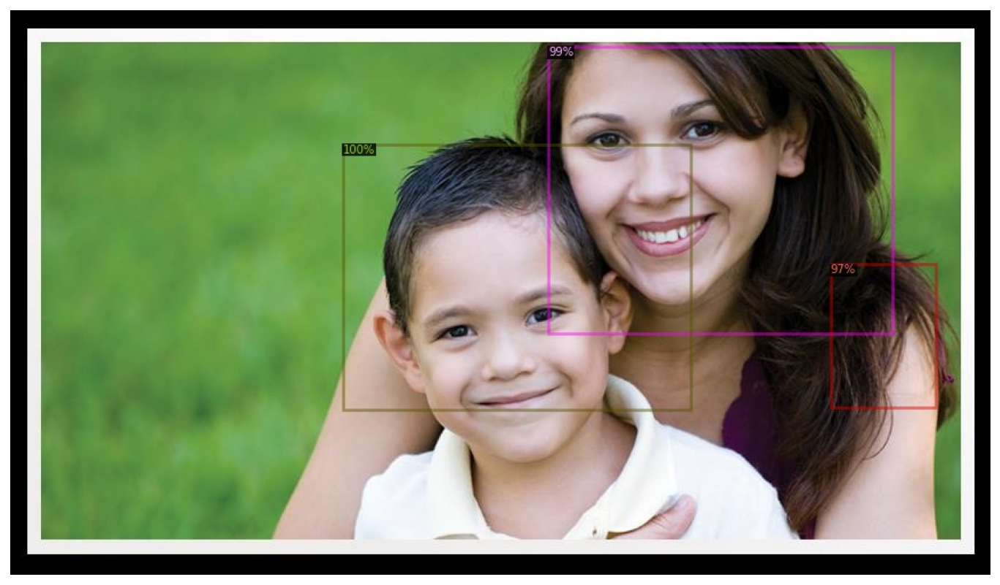

In [62]:
# Detectando faces em imagens
img = cv2.cvtColor(cv2.imread(annotated_images[9]), cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')

O modelo funcionou bem! Perceba que alguns erros ocorrram, o que é normal. Experimente ajustar os hiperparâmetros e treinar o modelo por mais tempo.

## Conclusão

Parabéns! Agora você sabe como usar o Detectron2 com PyTorch para detecção de objetos! Usar modelos pré-treinados pode ser uma arma poderosa para construir aplicações de Visão Computacional.

# Fim